## Preparing the environment

In [1]:
! pip install spotipy

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import gc

## Introduction

What useful features are present in audio files that can be extracted for future tasks? How do we extract these features for further use? What kind of tasks can we use the features we extracted from these songs for? 

This project, of which this notebook is the first part,  is as a result of the inspiration I had after seeing the [GTZAN dataset](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification?select=Data) which is popularly used for training models for music genre classification. I had the idea that if we could extract these features, then beyond genre classification, a simple recommendation algorithm could probably be built using clustering approach of unsupervised learning. The idea is basically to use KNearest Neighbirs to find similar songs. With no idea how this could go about, I tried to validate the idea in my head and while this is essentially a different task using different approaches, I likened it to Word2Vec embeddings used in the field of Natural Language Processing. It might not technically be a correct analogy, but it was enough to get me going. With no knowledge about extracting audio features from songs and what features are even important in music, I set to research and this is the first documentation of what was learned. All resources I used are included in the notebook.


This part of the project focuses on extracting useful features present in a song using python libraries. The idea behind this is to figure out important features present in music which could be used for further future tasks like genre classification and track-based recommendation algorithms.

In this part of the notebook, I've uploaded some audio files of different songs for analysis. Since they're only used here for educational purposes, they'll not be available for download for copyright reasons.

## Loading and Converting

In [3]:
# load the files
hiphop = '../input/music1/hiphop.mp3'
randb = '../input/music1/rb.mp3'
rock = '../input/music1/rock.mp3'

We use the pydub library to load and convert these files to the wav format for analysis. 

Documentation for pydub - https://github.com/jiaaro/pydub

In [4]:
from pydub import AudioSegment
raw_hiphop = AudioSegment.from_file(file=hiphop, format='mp3')
print(type(raw_hiphop))

<class 'pydub.audio_segment.AudioSegment'>


In [5]:
# export as a wav file
raw_hiphop.export(out_f='./hiphop.wav', format='wav')

<_io.BufferedRandom name='./hiphop.wav'>

In [6]:
# similarly

raw_rock = AudioSegment.from_file(file=rock, format='mp3')
raw_rock.export(out_f='./rock.wav', format='wav')

<_io.BufferedRandom name='./rock.wav'>

In [7]:
raw_randb = AudioSegment.from_file(file=randb, format='mp3')
raw_randb.export(out_f='./randb.wav', format='wav')

<_io.BufferedRandom name='./randb.wav'>

In [8]:
del raw_rock, raw_randb, raw_hiphop

gc.collect()

92

Librosa documentation - https://librosa.org/doc/latest/index.html

In [9]:
import librosa
import IPython.display as ipd

x, sr = librosa.load('./hiphop.wav')
ipd.Audio(x, rate=sr)

As we can see, this part of loading the audio files work as expected

In [10]:
# getting information from these songs

hiphop_wav = AudioSegment.from_file('./hiphop.wav')

print(f"Channels: {hiphop_wav.channels}")
print(f"Sample width: {hiphop_wav.sample_width}")
print(f"Frame rate (sample rate): {hiphop_wav.frame_rate}")
print(f"Frame width: {hiphop_wav.frame_width}")
print(f"Length (ms): {len(hiphop_wav)}")
print(f"Frame count: {hiphop_wav.frame_count()}")
print(f"Intensity: {hiphop_wav.dBFS}")

Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 256686
Frame count: 11319872.0
Intensity: -11.312419520488085


Let's wrap this in a function

In [11]:
def song_info(wav_input):
    """Prints the information obtained from the AudioSegment input
    of a wav file. Requires the pydub library for this to work.
    
    The information printed are the channels, sample width, frame rate, frame width, length
    frame count and intensity
    """
    from pydub import AudioSegment
    
    file_wav = AudioSegment.from_file(wav_input)
    
    print(f"Channels: {file_wav.channels}")
    print(f"Sample width: {file_wav.sample_width}")
    print(f"Frame rate (sample rate): {file_wav.frame_rate}")
    print(f"Frame width: {file_wav.frame_width}")
    print(f"Length (ms): {len(file_wav)}")
    print(f"Frame count: {file_wav.frame_count()}")
    print(f"Intensity: {file_wav.dBFS}")

In [12]:
# for the hiphop file as above

hiphop_wav = './hiphop.wav'
song_info(hiphop_wav)

Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 256686
Frame count: 11319872.0
Intensity: -11.312419520488085


In [13]:
randb_wav = './randb.wav'
song_info(randb_wav)

Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 157518
Frame count: 6946560.0
Intensity: -12.965543675621362


In [14]:
rock_wav = './rock.wav'
song_info(rock_wav)

Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 321411
Frame count: 14174208.0
Intensity: -22.3606278521674


What do these numbers mean?

* ```Channels```: A channel is a representation of sound going to or coming from a single point. A single microphone can produce one channel of audio, and a single speaker can accept one channel of audio, for example. A WAV file may have any number of channels. Typically, they have 1 (mono) or 2 (for stereo). The data of a WAV file is given as a sequence of frames. A frame consists of samples. There is one sample per channel, per frame. Every wav file has a sample width, or, the number of bytes per sample. Typically this is either 1 or 2 bytes. 

* ```Frame rate/Sample rate```: frequency of samples used (in Hertz)
* ```Frame width```: Number of bytes for each “frame”. One frame contains a sample for each channel.
* ```Length```: audio file length (in milliseconds)
* ```Frame count```: the number of frames from the sample
* ```Intensity```: Intensity in music refers to how loud or soft the musical piece is. The very basic understanding of intensity can be considered as the change in energy to the applied notes. This change of intensity in music is not just in the energy of notes played but also in the feel and volume of the notes played. The values given are loudness in dBFS (dB relative to the maximum possible loudness).

From the values, we see that the hip hop track has highest intensity


### Amplitude over time

In [15]:
import wave

hiphop_wave = wave.open('./hiphop.wav', 'r')
hiphop_sf = hiphop_wave.readframes(-1)

hiphop_sf = np.frombuffer(hiphop_sf, dtype='int16') # converts the audiobytes to integers
hiphop_framerate = hiphop_wave.getframerate() # gets the soundwave framerate from the wav file

time_sf = np.linspace(start=0, stop=len(hiphop_sf)/hiphop_framerate, num=len(hiphop_sf))


rock_wave = wave.open('./rock.wav', 'r')
rock_sf = rock_wave.readframes(-1)

rock_sf = np.frombuffer(rock_sf, dtype='int16')
rock_framerate = rock_wave.getframerate()
time_sf2 = np.linspace(start=0, stop=len(rock_sf)/rock_framerate, num=len(rock_sf))

randbwave = wave.open('./randb.wav', 'r')
randb_sf = randbwave.readframes(-1)

randb_sf = np.frombuffer(randb_sf, dtype='int16')
randb_framerate = randbwave.getframerate()
time_sf3 = np.linspace(start=0, stop=len(randb_sf)/randb_framerate, num=len(randb_sf))

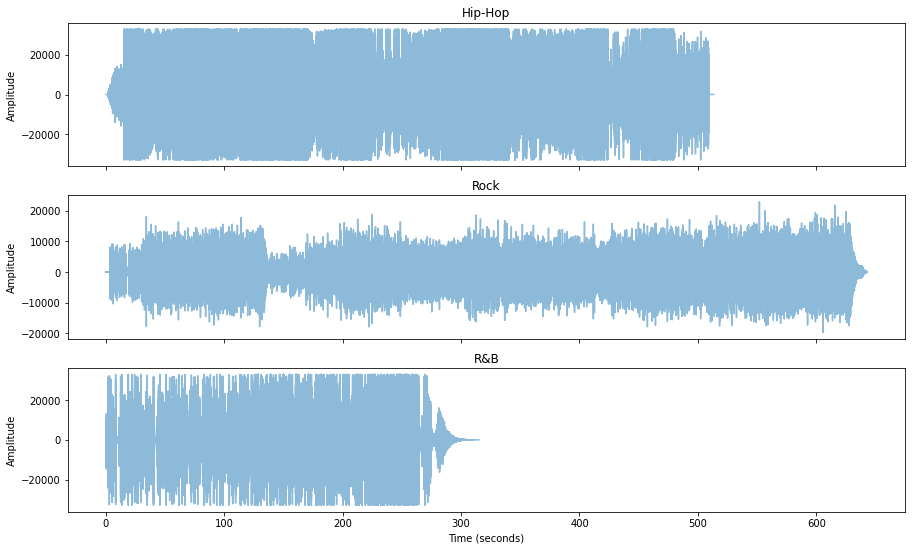

In [16]:
f, ax = plt.subplots(figsize=(15, 9), nrows=3, sharex=True)

# Add the audio data to the plot
ax[0].set(title='Hip-Hop', ylabel='Amplitude')
ax[0].plot(time_sf, hiphop_sf, label='Hip-Hop ', alpha=0.5)

# Add the audio data to the plot
ax[1].set(title='Rock', ylabel='Amplitude')
ax[1].plot(time_sf2, rock_sf, label='Rock', alpha=0.5)

# Add the audio data to the plot
ax[2].set(title='R&B', xlabel="Time (seconds)", ylabel='Amplitude')
ax[2].plot(time_sf3, randb_sf, alpha=0.5)

In [17]:
del f, ax

gc.collect()

12267

### Audio Analysis with Librosa

In order to work with the librosa library for audio manipulation and feature extractiom, we first need to load the wav inputs of the audio files. This is done with the librosa.load(path) function. This function returns two objects - the numpy array of the audio time series of the audio input and the sampling rate.

The documentation to this function - https://librosa.org/doc/latest/generated/librosa.load.html?highlight=load#librosa.load

In [18]:
import librosa
import librosa.display

# for hiphop
x_1, sr_1 = librosa.load(hiphop_wav, sr=None)

# for rock
x_2, sr_2 = librosa.load(rock_wav, sr=None)

# for R & B
x_3, sr_3 = librosa.load(randb_wav, sr=None)

### WaveForm

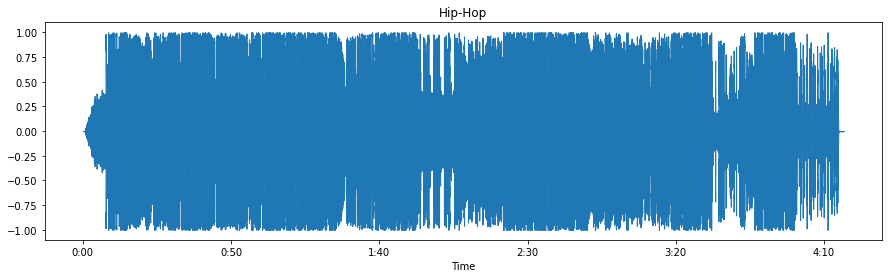

In [19]:
plt.figure(figsize=(15, 4))
plt.title('Hip-Hop')
librosa.display.waveshow(x_1, sr=sr_1)

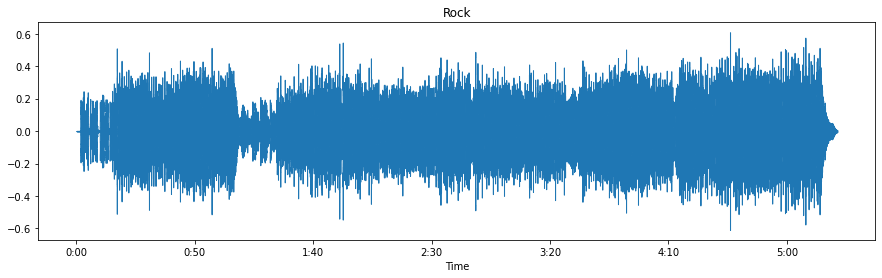

In [20]:
plt.figure(figsize=(15, 4))
plt.title('Rock')
librosa.display.waveshow(x_2, sr=sr_2)

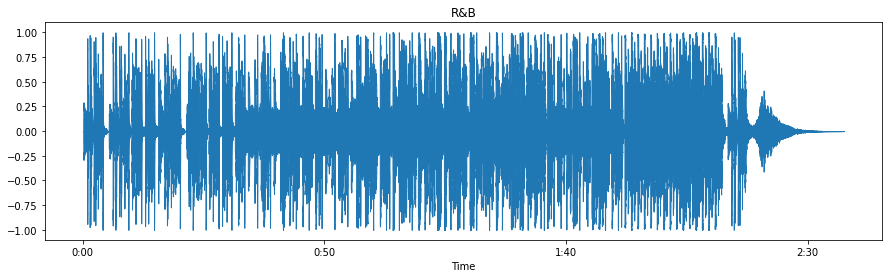

In [21]:
plt.figure(figsize=(15, 4))
plt.title('R&B')
librosa.display.waveshow(x_3, sr=sr_3)

### Spectogram

A spectogram is a visual representation of a spectrum of frequencies of a signal as it varies with time. Spectograms are important in the field of music, speech processing, linguistics and other areas. Spectograms of audio can be used to identify spoken words phonetically and to analyse the calls of animals. [[1]](https://en.wikipedia.org/wiki/Spectrogram)

A spectogram is a visual way of representing the signal strength, or 'loudness' of a signal over time at various frequencies present in a particular waveform. One can see wether there is more or less energy at different level and also see how these energy levels vary with time as can be seen in the spectogram plots below used with the librosa library. 

Spectrograms are basically two-dimensional graphs, with a third dimension represented by colors. Time runs from left (oldest) to right (youngest) along the horizontal axis. The vertical axis represents frequencies with the lowest frequencies at the bottom and the highest at the top. The amplitude or 'energy levels' of a particular frequency and at a particular time is represented by the third dimension (which we see below with the plt.colorbar() function) in colors, with dark blues corresponding to low amplitudes and brighter colors up through red corresponding to progressively stronger (or louder) amplitudes.  [[2]](https://pnsn.org/spectrograms/what-is-a-spectrogram#:~:text=A%20spectrogram%20is%20a%20visual,energy%20levels%20vary%20over%20time.)

In order to have a spectogram of the audio data:
* we need to first load the wav file. This has been done above with the librosa.load(path_to_wavfile, sr=sr) function where sr refers to sample rate. This function returns two objects. The first one, which is need for further work, is the audio time series of the wav file input in type numpy array.

* Do a Short-time Fourier Transform(STFT) of the audio time series: STFT is a Fourier-related transform used to determine the sinusoidal frequency and phase content of local sections of a signal as it changes over time.  Simply, in the continuous-time case, the function to be transformed is multiplied by a window function which is nonzero for only a short period of time. 

The Fourier transform (a one-dimensional function) of the resulting signal is taken as the window is slid along the time axis, resulting in a two-dimensional representation of the signal. A difference between STFT and Regular Fourier Transform is that STFT provides time-localized frequency information for situations in which frequency components of a signal vary over time (like in this application in speech and music) whereas standard Fourier Transform provides the frequency information averaged over the entire signal time interval. This can be represented mathematically as 

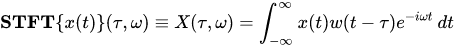

This is done with the librosa.stft(audio_time_seriesarray) function.

The STFT is invertible, that is, the original signal can be recovered from the transform by the Inverse STFT. This is done with the librosa.istft(stft_matrix)

* The absolute value of the amplitude of the audio data was converted to decibels. It is this information that is plotted against time.

Documentation for spectoshow in librosa: https://librosa.org/doc/latest/generated/librosa.display.specshow.html#librosa.display.specshow

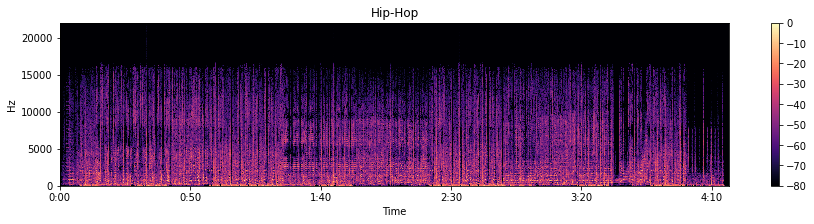

In [22]:
plt.figure(figsize=(15, 3))
D1 = librosa.amplitude_to_db(np.abs(librosa.stft(x_1)), ref = np.max)
librosa.display.specshow(D1, y_axis='linear', x_axis='time', sr=sr_1)
plt.title('Hip-Hop')
plt.colorbar()

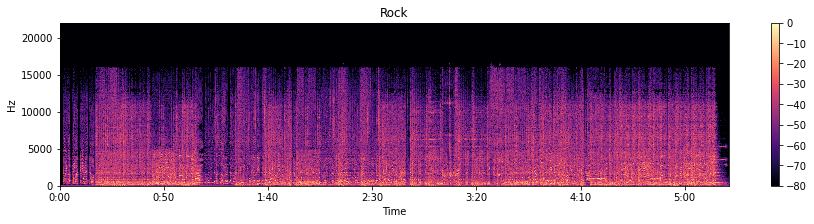

In [23]:
plt.figure(figsize=(15, 3))
D2 = librosa.amplitude_to_db(np.abs(librosa.stft(x_2)), ref = np.max)
librosa.display.specshow(D2, y_axis='linear', x_axis='time', sr=sr_2)
plt.title('Rock')
plt.colorbar()

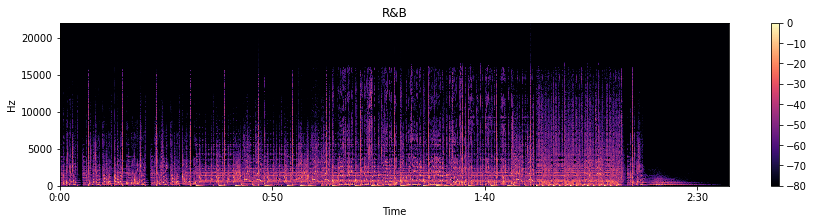

In [24]:
plt.figure(figsize=(15, 3))
D3 = librosa.amplitude_to_db(np.abs(librosa.stft(x_3)), ref = np.max)
librosa.display.specshow(D3, y_axis='linear', x_axis='time', sr=sr_3)
plt.title('R&B')
plt.colorbar()

In [25]:
import gc

del D1, D2, D3
gc.collect()

23

## Feature Extraction

In this section, we start to ask what features are important to extract from these audio files. All of this will be done with the librosa library. 

### Spectral Centroid

The spectral centroid is a measure used in audio signal processing used to characterise a spectrum. It indicates where the centre of mass of the spectrum is located. It is a measure of the amplitude at the center of the spectrum of the signal distribution over a window calculated from the Fourier transform frequency and amplitude information. Perceptually, it has a robust connection with the impression of 'brightness' of a sound. 

We do this in with the librosa.feature.spectral_centroid(audio_timeseries) function. The function takes in the numpy array of the audio time series as an input. This was returned by the librosa.load(path) function

Documentation: https://librosa.org/doc/latest/generated/librosa.feature.spectral_centroid.html#librosa.feature.spectral_centroid

In [26]:
from librosa.feature import spectral_centroid

hiphop_centroid = spectral_centroid(y=x_1, sr=sr)
rock_centroid = spectral_centroid(y=x_2, sr=sr)
randb_centroid = spectral_centroid(y=x_3, sr=sr)

In [27]:
hiphop_centroid

array([[0., 0., 0., ..., 0., 0., 0.]])

In [28]:
hiphop_centroid.shape

(1, 22110)

Text(0, 0.5, 'Hz')

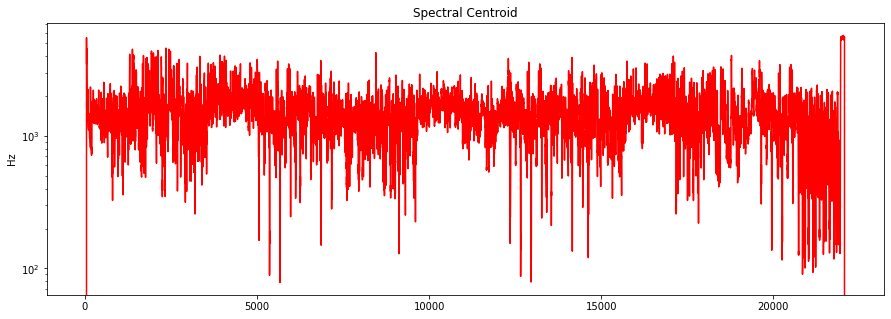

In [29]:
plt.figure(figsize=(15,5))
plt.title("Spectral Centroid")
plt.semilogy(hiphop_centroid.T, "r")
plt.ylabel("Hz")

Text(0, 0.5, 'Hz')

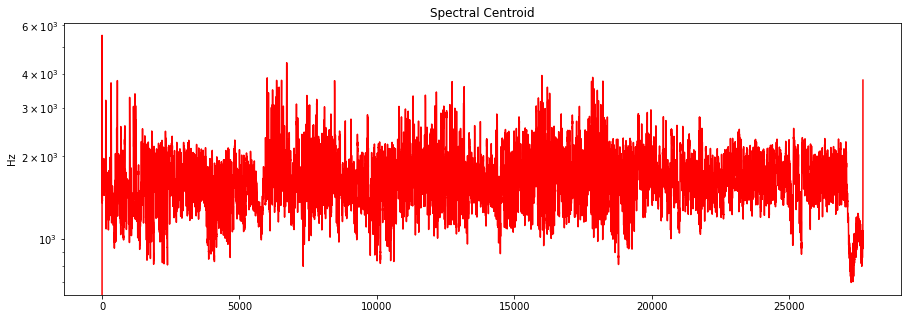

In [30]:
plt.figure(figsize=(15,5))
plt.title("Spectral Centroid")
plt.semilogy(rock_centroid.T, "r")
plt.ylabel("Hz")

Text(0, 0.5, 'Hz')

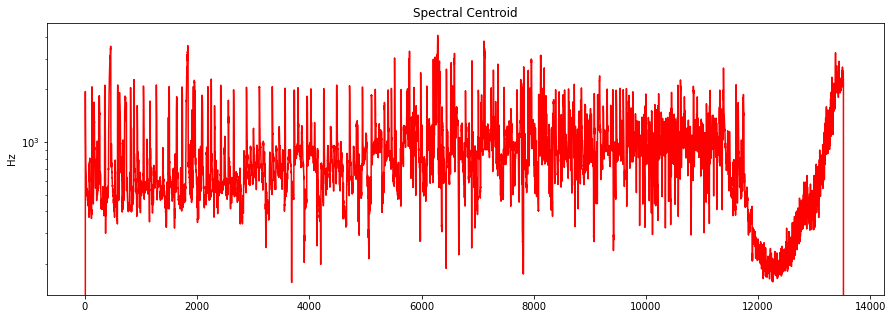

In [31]:
plt.figure(figsize=(15,5))
plt.title("Spectral Centroid")
plt.semilogy(randb_centroid.T, "r")
plt.ylabel("Hz")

### Root Mean Square

An audio signal can have both positive and negative amplitude values. Using the arithmetic mean will have the positive and negative values offset each other and will lead to zero. The root mean square (rms) is based on the magnitude of a signal as a measure of signal strength, regardless of whether the amplitude is positive or negative. The magnitude is calculated by squaring each sample value (so they are all positive), then the signal average is calculated, eventually followed by the square root operation. More completely, the RMS level is, “the square root of the arithmetic mean of the signal squared.” [[1]](https://www.hackaudio.com/digital-signal-processing/amplitude/rms-amplitude/)

In layman terms, this can be interpreted as the loudness or energy parameter of the audio file.

Documentation - https://librosa.org/doc/latest/generated/librosa.feature.rms.html#librosa.feature.rms


In [32]:
from librosa.feature import rms

hiphop_rms = rms(y = x_1)
rock_rms = rms(y = x_2)
randb_rms = rms(y = x_3)

In [33]:
hiphop_rms.shape

(1, 22110)

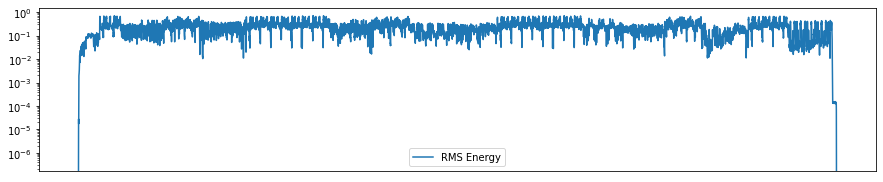

In [34]:
plt.figure(figsize=(15, 3))
times = librosa.times_like(hiphop_rms)
plt.semilogy(times, hiphop_rms[0], label='RMS Energy')
plt.xticks([])
plt.legend()

Text(0.5, 1.0, 'log Power spectrogram')

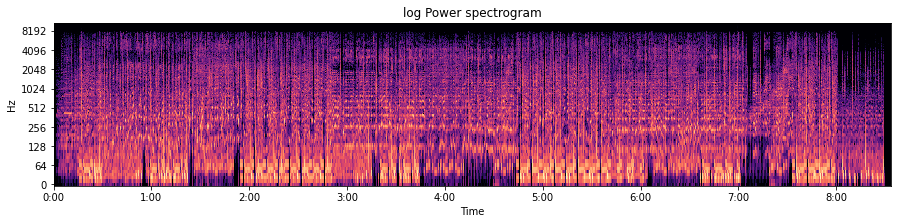

In [35]:
S, phase = librosa.magphase(librosa.stft(x_1))
plt.figure(figsize=(15, 3))
librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max),
                         y_axis='log', x_axis='time')
plt.title('log Power spectrogram')

### Zero crossing rate

The zero crossing rate of a signal is the rate at which a signal changes from a positive to negative or from negative to positive. Its value has been used in both speech recognition and music information retrieval, being a key feature to classify percussive sounds. It usually has higher values for highly percussive sounds like those in metal and rock

This feature can be extracted from the audio signal by using the librosa.feature.zero_crossing_rate() feature

![](https://editor.analyticsvidhya.com/uploads/805691280px-Zero_crossing.png)

In [36]:
from librosa.feature import zero_crossing_rate

hiphop_zcr = zero_crossing_rate(x_1)
rock_zcr = zero_crossing_rate(x_2)
randb_zcr = zero_crossing_rate(x_3)

In [37]:
hiphop_zcr

array([[0., 0., 0., ..., 0., 0., 0.]])

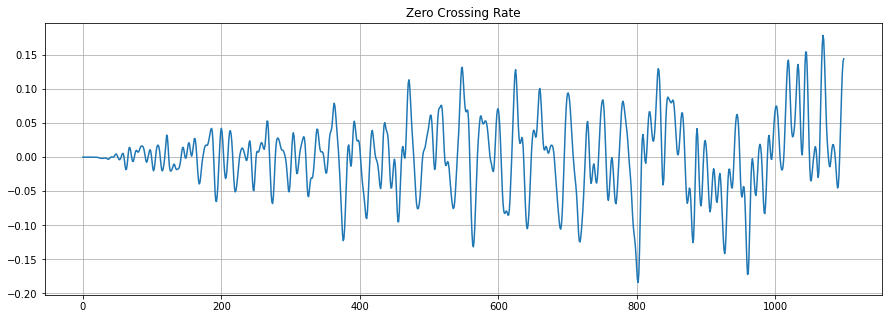

In [38]:
plt.figure(figsize=(15,5))
plt.title("Zero Crossing Rate")
plt.plot(x_3[4000:5100])
plt.grid()

In [39]:
hiphop_zcr.sum(), rock_zcr.sum(), randb_zcr.sum()

(1433.87255859375, 2294.47216796875, 558.1611328125)

As we can see from the above, the rock music file has the highest ZCR while the R&B file has the lowest ZCR

### Spectral contrast

Spectral contrast is defined as the decibel difference between peaks and valleys in the spectrum. It considers the spectral peak, the spectral valley, and their difference in each frequency subband.

In [40]:
from librosa.feature import spectral_contrast

hiphop_contrast = spectral_contrast(y=x_1)
rock_contrast = spectral_contrast(y=x_2)
randb_contrast = spectral_contrast(y=x_3)

In [41]:
rock_contrast.shape

(7, 27685)

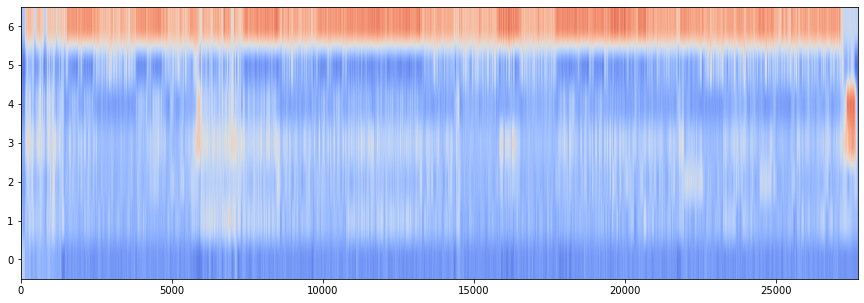

In [42]:
from sklearn.preprocessing import minmax_scale
plt.figure(figsize=(15, 5))
normalized = minmax_scale(rock_contrast, axis=1)
plt.imshow(normalized, aspect='auto', origin='lower', cmap='coolwarm')

### Mel-frequency cepstral coefficients (MFCCs)

In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency. The Mel Frequency Cepstral Coefficients (MFCC) are commonly used in order to extract essential information from a voice signal and became a popular feature extractor used in audio processing. MFCCs are also increasingly finding uses in music information retrieval applications such as genre classification, audio similarity measures.

Resources for more info: https://www.analyticsvidhya.com/blog/2021/06/mfcc-technique-for-speech-recognition/

Documentation - https://librosa.org/doc/latest/generated/librosa.feature.mfcc.html#librosa.feature.mfcc

In [43]:
from librosa.feature import mfcc

hiphop_mfcc = mfcc(y = x_1)
rock_mfcc = mfcc(y = x_2)
randb_mfcc = mfcc(y = x_3)

In [44]:
hiphop_mfcc.shape

(20, 22110)

### Spectral rolloff

Spectral rolloff is the frequency below which a specified percentage of the total spectral energy. It is a measure of the shape of the signal. It represents the frequency at which high frequencies decline to 0. To obtain it, we have to calculate the fraction of bins in the power spectrum where 85% of its power is at lower frequencies.

In [45]:
from librosa.feature import spectral_rolloff

hiphop_rolloff = spectral_rolloff(y=x_1)
rock_rolloff = spectral_rolloff(y=x_2)
randb_rolloff = spectral_rolloff(y=x_3)

In [46]:
hiphop_rolloff.shape

(1, 22110)

In [47]:
rock_rolloff

array([[   0.        , 9054.71191406, 9151.61132812, ..., 2465.55175781,
        3154.61425781, 7924.21875   ]])

### Chroma

Compute a chromagram from a waveform or power spectrogram.

In [48]:
from librosa.feature import chroma_stft

hiphop_st = chroma_stft(y=x_1)
rock_st = chroma_stft(y=x_2)
randb_st = chroma_stft(y=x_3)

In [49]:
hiphop_st.shape

(12, 22110)

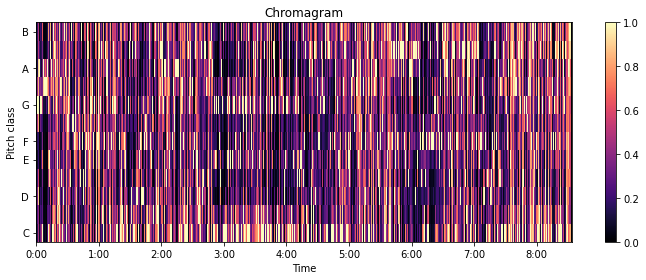

In [50]:
plt.figure(figsize=(10, 4))
librosa.display.specshow(hiphop_st, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram')
plt.tight_layout()

### Tempogram

Tempogram, a mid-level representation of tempo information, is constructed to characterize tempo variation and local pulse in the audio signal. The tempo of an audio is the speed of the musical piece. It refers to the rate of of the musical beat and is given by the reciprocal of the beat period. Tempo is defined in terms of beats per minutes.

Tempo can vary locally within a piece. Therefore, we introduce the tempogram as a feature matrix which indicates the prevalence of certain tempi at each moment in time.

In [51]:
from librosa.feature import tempogram

hiphop_tempo = tempogram(y=x_1)
rock_tempo = tempogram(y= x_2)
randb_tempo = tempogram(y= x_3)

In [52]:
hiphop_tempo.shape

(384, 22110)

### Spectral bandwidth

In [53]:
from librosa.feature import spectral_bandwidth

hiphop_bandwidth = spectral_bandwidth(y=x_1)
rock_bandwidth = spectral_bandwidth(y=x_2)
randb_bandwidth = spectral_bandwidth(y=x_3)

In [54]:
hiphop_bandwidth.shape

(1, 22110)

### Spectral flatness

In [55]:
from librosa.feature import spectral_flatness 

hiphop_flatness = spectral_flatness(y=x_1)
rock_flatness = spectral_flatness(y=x_2)
randb_flatness = spectral_flatness(y=x_3)

In [56]:
hiphop_flatness.shape

(1, 22110)

## Resources

1.  [Towards Data Science](https://towardsdatascience.com/get-to-know-audio-feature-extraction-in-python-a499fdaefe42)
2.  [KDnuggets](https://www.kdnuggets.com/2020/02/audio-data-analysis-deep-learning-python-part-1.html)
3. [Analytics India Magazine](https://analyticsindiamag.com/a-tutorial-on-spectral-feature-extraction-for-audio-analytics/)
4. [GTZAN Dataset](https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification)
5. [Important Kaggle Notebook](https://www.kaggle.com/code/volkandl/audio-processing-features-cnn-training)
6. [Another imporant notebook](https://www.kaggle.com/code/hamditarek/audio-data-analysis-using-librosa#Resnet-Model)
7. [Recommendation system with Spotify Dataset](https://www.kaggle.com/code/vatsalmavani/music-recommendation-system-using-spotify-dataset/notebook#Building-Music-Recommendation-System-using-Spotify-Dataset)
8. [mfcc recommendation](https://towardsdatascience.com/build-a-mfcc-based-music-recommendation-engine-on-cloud-3bf3cfbd594b)
9. [Extracting from spotify](https://towardsdatascience.com/extracting-song-data-from-the-spotify-api-using-python-b1e79388d50)

## Putting it all together

Following the ideas of the columns of the GTZAN dataset which is used for building genre classification models, the approach here is to summarize the features with statistical tools like mean, var, max etc for the features extracted using librosa from the audio files.

In [57]:
# file name and genre

filename = ['Hip-hop', 'Rock', 'R & B']
genre = ['hiphop', 'rock', 'r & b']

In [58]:
# chroma_stft_mean

hh_chroma_mean = hiphop_st.mean()
rock_chroma_mean = rock_st.mean()
randb_chroma_mean = randb_st.mean()


l = [hh_chroma_mean, rock_chroma_mean, randb_chroma_mean]
l

[0.42443675, 0.40522164, 0.39595392]

In [59]:
# a better way

chroma_stft_mean = []
chroma_stft_var = []


for chroma in [hiphop_st, rock_st, randb_st]:
    chroma_stft_mean.append(chroma.mean())
    chroma_stft_var.append(chroma.var())
    
chroma_stft_mean

[0.42443675, 0.40522164, 0.39595392]

In [60]:
rms_mean = []
rms_var = []

for rms in [hiphop_rms, rock_rms, randb_rms]:
    rms_mean.append(rms.mean())
    rms_var.append(rms.var())
    
rms_mean

[0.23342441, 0.05878167, 0.1654938]

In [61]:
spectral_centroid_mean = []
spectral_centroid_var = []

for centroid in [hiphop_centroid, rock_centroid, randb_centroid]:
    spectral_centroid_mean.append(centroid.mean())
    spectral_centroid_var.append(centroid.var())

spectral_centroid_mean

[1455.2277216204839, 1666.5160978376698, 878.682859460712]

In [62]:
zcr_mean = []
zcr_var = []

for zcr in [hiphop_zcr, rock_zcr, randb_zcr]:
    zcr_mean.append(zcr.mean())
    zcr_var.append(zcr.var())
zcr_mean

[0.06485176655783582, 0.08287780993204805, 0.04113805518960053]

In [63]:
spectral_contrast_mean = []
spectral_contrast_var = []

for contrast in [hiphop_contrast, rock_contrast, randb_contrast]:
    spectral_contrast_mean.append(contrast.mean())
    spectral_contrast_var.append(contrast.var())
    
spectral_contrast_mean

[22.33371099282017, 20.44891720660219, 21.340526106794993]

In [64]:
spectral_rolloff_mean = []
spectral_rolloff_var = []

for rolloff in [hiphop_rolloff, rock_rolloff, randb_rolloff]:
    spectral_rolloff_mean.append(rolloff.mean())
    spectral_rolloff_var.append(rolloff.var())
    
spectral_rolloff_mean

[3018.8304173380257, 3614.927405973451, 1663.7121218555378]

In [65]:
tempo_mean = []
tempo_var = []

for tempo in [hiphop_tempo, rock_tempo, randb_tempo]:
    tempo_mean.append(tempo.mean())
    tempo_var.append(tempo.var())
    
tempo_mean

[0.1595367487230622, 0.21353114110991167, 0.15316250907073134]

In [66]:
bandwidth_mean = []
bandwidth_var = []

for bandwidth in [hiphop_bandwidth, rock_bandwidth, randb_bandwidth]:
    bandwidth_mean.append(bandwidth.mean())
    bandwidth_var.append(bandwidth.var())
    
bandwidth_mean

[1558.844293226863, 1711.041938082477, 1053.606693980105]

In [67]:
flatness_mean = []
flatness_var = []

for flatness in [hiphop_flatness, rock_flatness, randb_flatness]:
    flatness_mean.append(flatness.mean())
    flatness_var.append(flatness.var())
    
flatness_mean

[0.004779444, 0.0006914365, 0.004107856]

In [68]:
hiphop_mfcc[19]

array([0., 0., 0., ..., 0., 0., 0.], dtype=float32)

In [69]:
mfcc1_mean = []
mfcc1_var = []

for mfcc in [hiphop_mfcc[1], rock_mfcc[1], randb_mfcc[1]]:
    mfcc1_mean.append(mfcc.mean())
    mfcc1_var.append(mfcc.var())
mfcc1_mean

[132.43384, 139.55313, 153.80037]

In [70]:
hiphopmfcc_mean = {}
rockmfcc_mean = {}
randbmfcc_mean = {}

for i in range(1, 20):
    hiphopmfcc_mean[f"mfcc{i}_mean"] = hiphop_mfcc[i].mean()
    rockmfcc_mean[f"mfcc{i}_mean"] = rock_mfcc[i].mean()
    randbmfcc_mean[f"mfcc{i}_mean"] = randb_mfcc[i].mean()

In [71]:
hiphopmfcc_mean

{'mfcc1_mean': 132.43384,
 'mfcc2_mean': -26.186121,
 'mfcc3_mean': 38.730034,
 'mfcc4_mean': -12.579794,
 'mfcc5_mean': 21.33854,
 'mfcc6_mean': -6.316353,
 'mfcc7_mean': 4.6771903,
 'mfcc8_mean': -1.1319643,
 'mfcc9_mean': 2.0097427,
 'mfcc10_mean': 3.3343422,
 'mfcc11_mean': 0.8078492,
 'mfcc12_mean': 2.4206634,
 'mfcc13_mean': -1.0258615,
 'mfcc14_mean': 5.612173,
 'mfcc15_mean': 0.08669393,
 'mfcc16_mean': 6.6229053,
 'mfcc17_mean': 0.33866054,
 'mfcc18_mean': 2.1627393,
 'mfcc19_mean': 1.386049}

In [72]:
# let's concat these values
temp = pd.Series(hiphopmfcc_mean)
temp1 = pd.Series(rockmfcc_mean)
temp2 = pd.Series(randbmfcc_mean)

x = pd.concat([temp, temp1, temp2], axis=1)
mfcc = x.T

In [73]:
mfcc

,mfcc1_mean,mfcc2_mean,mfcc3_mean,mfcc4_mean,mfcc5_mean,mfcc6_mean,mfcc7_mean,mfcc8_mean,mfcc9_mean,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean
0,132.433838,-26.186121,38.730034,-12.579794,21.338539,-6.316353,4.677190,-1.131964,2.009743,3.334342,0.807849,2.420663,-1.025862,5.612173,0.086694,6.622905,0.338661,2.162739,1.386049
1,139.553131,-43.427402,59.499023,-21.767904,31.093647,-8.545162,6.575154,-0.809160,1.538420,2.924627,-6.065069,0.822038,-2.504283,-0.537745,-2.144833,7.072705,-2.023793,4.877814,-2.644700
2,153.800369,-1.735827,12.374794,3.635884,7.572478,4.468874,5.509320,-0.997765,5.197109,3.224919,-1.200195,-0.521231,-1.579971,0.960346,0.044472,4.030352,3.042888,0.648253,-1.428200


Let's put all the features we have extracted from the audio files into one dataframe

In [74]:
data = pd.DataFrame({'filename': filename, 'genre': genre, 'chroma_stft_mean': chroma_stft_mean, 'chroma_stft_var': chroma_stft_var, 'rms_mean': rms_mean,
                    'rms_var': rms_var, 'spectral_centroid_mean': spectral_centroid_mean, 'spectral_centroid_var': spectral_centroid_var,
                    'zcr_mean': zcr_mean, 'zcr_var': zcr_var, 'spectral_contrast_mean': spectral_contrast_mean, 'spectral_contrast_var': spectral_contrast_var, 
                    'spectral_rolloff_mean': spectral_rolloff_mean, 'spectral_rolloff_var': spectral_rolloff_var, 'tempo_mean': tempo_mean, 'tempo_var': tempo_var, \
                     'bandwidth_mean': bandwidth_mean, 'bandwidth_var': bandwidth_var, 'flatness_mean': flatness_mean, 'flatness_var': flatness_var
                    })

data

,filename,genre,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,zcr_mean,zcr_var,spectral_contrast_mean,spectral_contrast_var,spectral_rolloff_mean,spectral_rolloff_var,tempo_mean,tempo_var,bandwidth_mean,bandwidth_var,flatness_mean,flatness_var
0,Hip-hop,hiphop,0.424437,0.094027,0.233424,0.017242,1455.227722,447864.277504,0.064852,0.003061,22.333711,82.624682,3018.830417,1.744974e+06,0.159537,0.036929,1558.844293,158714.858665,0.004779,0.003977
1,Rock,rock,0.405222,0.085367,0.058782,0.000619,1666.516098,160552.990383,0.082878,0.001328,20.448917,71.687851,3614.927406,7.188066e+05,0.213531,0.058602,1711.041938,63853.664660,0.000691,0.000110
2,R & B,r & b,0.395954,0.098307,0.165494,0.017200,878.682859,255561.633906,0.041138,0.001177,21.340526,62.057295,1663.712122,1.328722e+06,0.153163,0.037940,1053.606694,264263.679509,0.004108,0.003681


In [75]:
data = pd.concat([data, mfcc], axis=1)
data

,filename,genre,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,zcr_mean,zcr_var,...,mfcc10_mean,mfcc11_mean,mfcc12_mean,mfcc13_mean,mfcc14_mean,mfcc15_mean,mfcc16_mean,mfcc17_mean,mfcc18_mean,mfcc19_mean
0,Hip-hop,hiphop,0.424437,0.094027,0.233424,0.017242,1455.227722,447864.277504,0.064852,0.003061,...,3.334342,0.807849,2.420663,-1.025862,5.612173,0.086694,6.622905,0.338661,2.162739,1.386049
1,Rock,rock,0.405222,0.085367,0.058782,0.000619,1666.516098,160552.990383,0.082878,0.001328,...,2.924627,-6.065069,0.822038,-2.504283,-0.537745,-2.144833,7.072705,-2.023793,4.877814,-2.644700
2,R & B,r & b,0.395954,0.098307,0.165494,0.017200,878.682859,255561.633906,0.041138,0.001177,...,3.224919,-1.200195,-0.521231,-1.579971,0.960346,0.044472,4.030352,3.042888,0.648253,-1.428200


In [76]:
gc.collect()

23358

In [77]:
data.to_csv('music_features.csv', index=False)

## Even More Features from Spotify

In [78]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

The client id and client secret would be removed from the final version of this notebook to be publicly available

In [79]:
# authenticating
cid = '2374df43ce0d43338a8935a4927a45c2'
secret = '55af5637b56647b4b17e983ef4b78835'

client_credentials_manager = SpotifyClientCredentials(client_id=cid, client_secret=secret)
sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

In [80]:
# test - top tracks from Led Zeppelin

lz_uri = 'spotify:artist:36QJpDe2go2KgaRleHCDTp'

results = sp.artist_top_tracks(lz_uri)

for track in results['tracks'][:10]:
    print('track    : ' + track['name'])
    print('audio    : ' + track['preview_url'])
    print('cover art: ' + track['album']['images'][0]['url'])
    print()

track    : Stairway to Heaven - Remaster
audio    : https://p.scdn.co/mp3-preview/fc80a280376d5142c888475bd8fdcd00b4fc8d7d?cid=2374df43ce0d43338a8935a4927a45c2
cover art: https://i.scdn.co/image/ab67616d0000b273c8a11e48c91a982d086afc69

track    : Immigrant Song - Remaster
audio    : https://p.scdn.co/mp3-preview/e5910b86cc788766388cca1c494094e39186aa1e?cid=2374df43ce0d43338a8935a4927a45c2
cover art: https://i.scdn.co/image/ab67616d0000b27390a50cfe99a4c19ff3cbfbdb

track    : Whole Lotta Love - 1990 Remaster
audio    : https://p.scdn.co/mp3-preview/f3765a6c5b194302c6e7fffc31ba21e2bd616cf6?cid=2374df43ce0d43338a8935a4927a45c2
cover art: https://i.scdn.co/image/ab67616d0000b273fc4f17340773c6c3579fea0d

track    : Black Dog - Remaster
audio    : https://p.scdn.co/mp3-preview/f82af31817a7ec198a709e68f0f0f9edfc9a7e81?cid=2374df43ce0d43338a8935a4927a45c2
cover art: https://i.scdn.co/image/ab67616d0000b273c8a11e48c91a982d086afc69

track    : Kashmir - Remaster
audio    : https://p.scdn.co/mp3

All works well. Let's extract some useful information for the tracks we have above

In [81]:
# the spotify links to the track we're using
hiphop_url = 'https://open.spotify.com/track/58q2HKrzhC3ozto2nDdN4z?si=c4063d12819147f8'
rock_url = 'https://open.spotify.com/track/4DMKwE2E2iYDKY01C335Uw?si=c2f94b2f1f4745ab'
randb_url = 'https://open.spotify.com/track/1ZdhOMWyFR8Iv9eylMGYg2?si=efb50505a05e4c7d'

# let's get the uniform resource identify from these urls
hiphop_uri = hiphop_url.split('/')[-1].split('?')[0]
rock_uri = rock_url.split('/')[-1].split('?')[0]
randb_uri = randb_url.split('/')[-1].split('?')[0]

In [82]:
hiphop_features = sp.audio_features(tracks=hiphop_uri)
rock_features = sp.audio_features(tracks=rock_uri)
randb_features = sp.audio_features(tracks=randb_uri)

In [83]:
temp = pd.Series(hiphop_features[0])
temp1 = pd.Series(rock_features[0])
temp2 = pd.Series(randb_features[0])

spotify_features = pd.concat([temp, temp1, temp2], axis=1).T
spotify_features = spotify_features.drop(columns=['type', 'track_href', 'analysis_url', 'id', 'duration_ms', 'time_signature'])
spotify_features

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,uri
0,0.816,0.726,5,-3.998,0,0.129,0.099,0,0.372,0.65,136.048,spotify:track:58q2HKrzhC3ozto2nDdN4z
1,0.482,0.786,7,-5.735,1,0.032,0.00321,0.000089,0.446,0.793,126.755,spotify:track:4DMKwE2E2iYDKY01C335Uw
2,0.494,0.428,0,-7.239,0,0.205,0.236,0.0698,0.0816,0.44,87.724,spotify:track:1ZdhOMWyFR8Iv9eylMGYg2


In [84]:
x = pd.Series(filename)
spotify_features = pd.concat([x, spotify_features], axis=1)
spotify_features = spotify_features.rename(columns={0: 'filename'})
spotify_features

,filename,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,uri
0,Hip-hop,0.816,0.726,5,-3.998,0,0.129,0.099,0,0.372,0.65,136.048,spotify:track:58q2HKrzhC3ozto2nDdN4z
1,Rock,0.482,0.786,7,-5.735,1,0.032,0.00321,0.000089,0.446,0.793,126.755,spotify:track:4DMKwE2E2iYDKY01C335Uw
2,R & B,0.494,0.428,0,-7.239,0,0.205,0.236,0.0698,0.0816,0.44,87.724,spotify:track:1ZdhOMWyFR8Iv9eylMGYg2


In [85]:
data.columns

Index(['filename', 'genre', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean',
       'rms_var', 'spectral_centroid_mean', 'spectral_centroid_var',
       'zcr_mean', 'zcr_var', 'spectral_contrast_mean',
       'spectral_contrast_var', 'spectral_rolloff_mean',
       'spectral_rolloff_var', 'tempo_mean', 'tempo_var', 'bandwidth_mean',
       'bandwidth_var', 'flatness_mean', 'flatness_var', 'mfcc1_mean',
       'mfcc2_mean', 'mfcc3_mean', 'mfcc4_mean', 'mfcc5_mean', 'mfcc6_mean',
       'mfcc7_mean', 'mfcc8_mean', 'mfcc9_mean', 'mfcc10_mean', 'mfcc11_mean',
       'mfcc12_mean', 'mfcc13_mean', 'mfcc14_mean', 'mfcc15_mean',
       'mfcc16_mean', 'mfcc17_mean', 'mfcc18_mean', 'mfcc19_mean'],
      dtype='object')

In [86]:
# let's merge the datasets
data = data.merge(spotify_features, on='filename', how='left')
data

,filename,genre,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,zcr_mean,zcr_var,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,uri
0,Hip-hop,hiphop,0.424437,0.094027,0.233424,0.017242,1455.227722,447864.277504,0.064852,0.003061,...,5,-3.998,0,0.129,0.099,0,0.372,0.65,136.048,spotify:track:58q2HKrzhC3ozto2nDdN4z
1,Rock,rock,0.405222,0.085367,0.058782,0.000619,1666.516098,160552.990383,0.082878,0.001328,...,7,-5.735,1,0.032,0.00321,0.000089,0.446,0.793,126.755,spotify:track:4DMKwE2E2iYDKY01C335Uw
2,R & B,r & b,0.395954,0.098307,0.165494,0.017200,878.682859,255561.633906,0.041138,0.001177,...,0,-7.239,0,0.205,0.236,0.0698,0.0816,0.44,87.724,spotify:track:1ZdhOMWyFR8Iv9eylMGYg2
